In [1]:
import alpaca_trade_api as alpaca
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import yfinance as yf
import hvplot.pandas

# Replace YOUR_API_KEY and YOUR_API_SECRET with your Alpaca API key and secret
alpaca_api = alpaca.REST('PKX4ZIXWV9HTG4JDDTMQ', 'BNb47rETbt7rJwuJxjJb42b3QtIr52TyhESHfogr', api_version='v2')

# Set the ticker symbol and time frame ( XLK - Info Tech )
ticker = "XLK"
timeframe = "60Min"

# Set the start and end dates for the data

start_date = "2008-01-01T00:00:00-00:00"
end_date = "2022-12-31T00:00:00-00:00"

# Retrieve the data
data = alpaca_api.get_bars(ticker,  timeframe, start_date, end_date).df

# Convert the data to a Pandas dataframe
df = pd.DataFrame(data)

df['HH21']=df['high'].rolling(21).max()
df['LL21']=df['low'].rolling(21).min()
df['50Pct']=0.5*(df['HH21']-df['LL21'])
df['61Pct']=(1-0.615)*(df['HH21']-df['LL21'])

df['50R']=df['close']/df['50Pct']
df['61R']=df['close']/df['61Pct']


# Calculate the 3 period moving average of the close
df['Mid']=(df['high']+df['low'])/2
df['3dH']=(df['high'].rolling(3).max().shift(-3))-df['close']#Shift this before subtracting close!!!!!!!!
df['3dL']=df['close']-(df['low'].rolling(3).min().shift(-3))
df['RewardRisk']=df['3dH']/df['3dL']

df['CPctile']=(df['high']-df['close'])/(df['high']-df['low'])
df['OPctile']=(df['high']-df['open'])/(df['high']-df['low'])

df['Range']=df['high']-df['low']
df['RangeT']=(df['Range']-df['Range'].rolling(30).mean())/df['Range'].rolling(30).std()

# Calculate the 20 period moving average of the close
#df['20MA'] = df['close'].rolling(20).mean()

#df['RewardRisk']=df['RewardRisk'].shift(-3)




df['close']=df['close'].pct_change()
df['Mid']=df['Mid'].pct_change()
df['target_close']=df['close']
df=df.drop(columns=['open','high','low','volume','trade_count','vwap','3dH','3dL','Range'])
           
df["Signal"] = 0.0
           



In [2]:
for index, row in df.iterrows():
    if row["target_close"] >= 0:
       df.loc[index, "Signal"] = 1.0
    if row["target_close"] < 0:
        df.loc[index,"Signal"] = 0.0

# Calculate the points in time at which a position should be taken, 1 or -1
#ema_signals_df['Crossover']= ema_signals_df['Signal'].diff()
#ema_signals_df=ema_signals_df.dropna()
#ema_signals_df['Crossover']=ema_signals_df['Crossover'].shift(-8)
df["Signal"]=df["Signal"].shift(-1)
df['FutureSlope']=df["target_close"].shift(-1)
#df['RR']=df["RewardRisk"]


df

,close,HH21,LL21,50Pct,61Pct,50R,61R,Mid,RewardRisk,CPctile,OPctile,RangeT,target_close,Signal,FutureSlope
timestamp,,,,,,,,,,,,,,,
2015-12-01 14:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.136364,0.035714,0.571429,NaN,NaN,0.0,-0.000452
2015-12-01 15:00:00+00:00,-0.000452,NaN,NaN,NaN,NaN,NaN,NaN,0.000793,0.181984,0.200000,0.120000,NaN,-0.000452,0.0,-0.000904
2015-12-01 16:00:00+00:00,-0.000904,NaN,NaN,NaN,NaN,NaN,NaN,0.000904,0.321802,0.538106,0.230177,NaN,-0.000904,1.0,0.000531
2015-12-01 17:00:00+00:00,0.000531,NaN,NaN,NaN,NaN,NaN,NaN,0.000171,0.720568,0.300000,0.545455,NaN,0.000531,0.0,-0.002339
2015-12-01 18:00:00+00:00,-0.002339,NaN,NaN,NaN,NaN,NaN,NaN,-0.001348,inf,0.712897,0.000000,NaN,-0.002339,1.0,0.001925
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-30 19:00:00+00:00,-0.000298,125.03,122.18,1.425,1.09725,86.409333,112.219913,-0.002230,125.315789,0.190571,0.142857,-0.293223,-0.000298,1.0,0.010612
2022-12-30 20:00:00+00:00,0.010612,125.03,122.50,1.265,0.97405,98.371542,127.755249,0.006421,1.500000,0.050360,0.985612,2.128209,0.010612,1.0,0.002732
2022-12-30 21:00:00+00:00,0.002732,125.03,122.55,1.240,0.95480,100.629032,130.687055,0.005532,NaN,0.033333,0.600000,0.301631,0.002732,0.0,-0.002238


In [3]:
df.tail(100)

,close,HH21,LL21,50Pct,61Pct,50R,61R,Mid,RewardRisk,CPctile,OPctile,RangeT,target_close,Signal,FutureSlope
timestamp,,,,,,,,,,,,,,,
2022-12-21 00:00:00+00:00,0.000396,126.38,124.155,1.1125,0.856625,113.600000,147.532468,0.000594,0.513514,0.000000,1.000000,-1.105525,0.000396,1.0,0.001503
2022-12-21 09:00:00+00:00,0.001503,126.57,124.155,1.2075,0.929775,104.819876,136.129709,0.000910,-0.236842,0.000000,1.000000,-0.733155,0.001503,0.0,-0.001422
2022-12-21 10:00:00+00:00,-0.001422,126.57,124.155,1.2075,0.929775,104.670807,135.936114,-0.000712,0.189655,NaN,NaN,-1.163223,-0.001422,0.0,-0.003007
2022-12-21 11:00:00+00:00,-0.003007,126.57,124.155,1.2075,0.929775,104.356108,135.527413,-0.002453,4.850000,1.000000,0.571429,-0.827561,-0.003007,0.0,-0.001587
2022-12-21 12:00:00+00:00,-0.001587,126.57,124.155,1.2075,0.929775,104.190476,135.312307,-0.000793,-31.285714,1.000000,0.000000,-0.334593,-0.001587,1.0,0.003895
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-30 19:00:00+00:00,-0.000298,125.03,122.180,1.4250,1.097250,86.409333,112.219913,-0.002230,125.315789,0.190571,0.142857,-0.293223,-0.000298,1.0,0.010612
2022-12-30 20:00:00+00:00,0.010612,125.03,122.500,1.2650,0.974050,98.371542,127.755249,0.006421,1.500000,0.050360,0.985612,2.128209,0.010612,1.0,0.002732
2022-12-30 21:00:00+00:00,0.002732,125.03,122.550,1.2400,0.954800,100.629032,130.687055,0.005532,NaN,0.033333,0.600000,0.301631,0.002732,0.0,-0.002238


In [4]:
#display(df.hvplot.scatter(y='CloseDiff3MA',x='3MASlope'))

lstColumns=df.columns

display(lstColumns)

dfopt=pd.DataFrame()

'''for column in lstColumns:
    display(df.hvplot.scatter(y='FutureSlope',x=column))
    dfopt=df[['FutureSlope',column]]
    display(dfopt.corr())'''
    
for column in lstColumns:
    display(df.hvplot.scatter(y='FutureSlope',x=column))
    dfopt=df[['FutureSlope',column]]
    display(dfopt.corr())

Index(['close', 'HH21', 'LL21', '50Pct', '61Pct', '50R', '61R', 'Mid',
       'RewardRisk', 'CPctile', 'OPctile', 'RangeT', 'target_close', 'Signal',
       'FutureSlope'],
      dtype='object')

:Scatter   [close]   (FutureSlope)

,FutureSlope,close
FutureSlope,1.000000,-0.047502
close,-0.047502,1.000000


:Scatter   [HH21]   (FutureSlope)

,FutureSlope,HH21
FutureSlope,1.000000,-0.010106
HH21,-0.010106,1.000000


:Scatter   [LL21]   (FutureSlope)

,FutureSlope,LL21
FutureSlope,1.000000,-0.010164
LL21,-0.010164,1.000000


:Scatter   [50Pct]   (FutureSlope)

,FutureSlope,50Pct
FutureSlope,1.000000,-0.004729
50Pct,-0.004729,1.000000


:Scatter   [61Pct]   (FutureSlope)

,FutureSlope,61Pct
FutureSlope,1.000000,-0.004729
61Pct,-0.004729,1.000000


:Scatter   [50R]   (FutureSlope)

,FutureSlope,50R
FutureSlope,1.000000,0.002171
50R,0.002171,1.000000


:Scatter   [61R]   (FutureSlope)

,FutureSlope,61R
FutureSlope,1.000000,0.002171
61R,0.002171,1.000000


:Scatter   [Mid]   (FutureSlope)

,FutureSlope,Mid
FutureSlope,1.000000,-0.037994
Mid,-0.037994,1.000000


:Scatter   [RewardRisk]   (FutureSlope)

,FutureSlope,RewardRisk
FutureSlope,1.000000,0.010543
RewardRisk,0.010543,1.000000


:Scatter   [CPctile]   (FutureSlope)

,FutureSlope,CPctile
FutureSlope,1.00000,0.04152
CPctile,0.04152,1.00000


:Scatter   [OPctile]   (FutureSlope)

,FutureSlope,OPctile
FutureSlope,1.000000,-0.024916
OPctile,-0.024916,1.000000


:Scatter   [RangeT]   (FutureSlope)

,FutureSlope,RangeT
FutureSlope,1.000000,-0.012708
RangeT,-0.012708,1.000000


:Scatter   [target_close]   (FutureSlope)

,FutureSlope,target_close
FutureSlope,1.000000,-0.047502
target_close,-0.047502,1.000000


:Scatter   [Signal]   (FutureSlope)

,FutureSlope,Signal
FutureSlope,1.000000,0.613274
Signal,0.613274,1.000000


:Scatter   [FutureSlope]   (FutureSlope)

,FutureSlope,FutureSlope
FutureSlope,1.0,1.0
FutureSlope,1.0,1.0


In [5]:
df=df.dropna()

y = df['Signal']

# Review the value count
y.value_counts()

1.0    10178
0.0     8660
Name: Signal, dtype: int64

In [6]:
# Select the start of the training period

from datetime import datetime
from pandas.tseries.offsets import DateOffset
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from pandas.tseries.offsets import DateOffset
from sklearn.metrics import classification_report

X = df[['50Pct','61Pct','RangeT','OPctile','CPctile']].dropna()




training_begin = X.index.min()

# Display the training begin date
print(training_begin)

training_end = X.index.min() + DateOffset(months=60)

# Display the training end date
print(training_end)

# Generate the X_train and y_train DataFrames
X_train = X.loc[training_begin:training_end]
y_train = y.loc[training_begin:training_end]

# Review the X_train DataFrame
display(X_train.head())
display(X_train.tail())

# Generate the X_test and y_test DataFrames
X_test = X.loc[training_end+DateOffset(hours=1):]
y_test = y.loc[training_end+DateOffset(hours=1):]

# Review the X_test DataFrame
X_test.head()

# Scale the features DataFrames

# Create a StandardScaler instance
scaler = StandardScaler()

# Apply the scaler model to fit the X-train data
X_scaler = scaler.fit(X_train)

# Transform the X_train and X_test DataFrames using the X_scaler
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

2015-12-04 16:00:00+00:00
2020-12-04 16:00:00+00:00


,50Pct,61Pct,RangeT,OPctile,CPctile
timestamp,,,,,
2015-12-04 16:00:00+00:00,0.6375,0.490875,-0.337330,0.066622,0.599600
2015-12-04 17:00:00+00:00,0.6375,0.490875,0.902848,0.864407,0.033898
2015-12-04 18:00:00+00:00,0.6375,0.490875,-0.642672,0.909091,0.136364
2015-12-04 19:00:00+00:00,0.6650,0.512050,-0.224093,0.693750,0.062500
2015-12-04 20:00:00+00:00,0.6775,0.521675,-0.386420,0.206897,0.586207


,50Pct,61Pct,RangeT,OPctile,CPctile
timestamp,,,,,
2020-12-04 12:00:00+00:00,0.61000,0.469700,-0.491697,0.058824,0.470588
2020-12-04 13:00:00+00:00,0.58750,0.452375,-0.522591,0.117647,0.705882
2020-12-04 14:00:00+00:00,0.58750,0.452375,1.259843,0.476190,0.126984
2020-12-04 15:00:00+00:00,0.60750,0.467775,1.042143,0.694915,0.237288
2020-12-04 16:00:00+00:00,0.75165,0.578770,0.917051,0.753651,0.278550


In [7]:
# From SVM, instantiate SVC classifier model instance
svm_model = svm.SVC(probability=True) 
# Fit the model to the data using the training data
svm_model = svm_model.fit(X_train_scaled, y_train)
# Use the testing data to make the model predictions
svm_pred = svm_model.predict(X_test_scaled)

# Review the model's predicted values
svm_pred

# Use a classification report to evaluate the model using the predictions and testing data
svm_testing_report = classification_report(y_test, svm_pred)

# Print the classification report
print(svm_testing_report)


              precision    recall  f1-score   support

         0.0       0.51      0.16      0.24      3107
         1.0       0.53      0.86      0.66      3430

    accuracy                           0.53      6537
   macro avg       0.52      0.51      0.45      6537
weighted avg       0.52      0.53      0.46      6537



<AxesSubplot: xlabel='timestamp'>

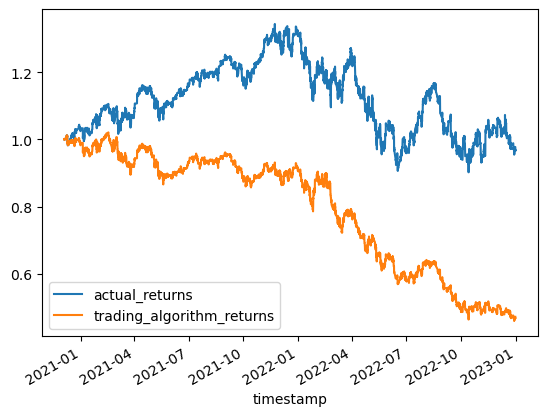

In [8]:
# Create a predictions DataFrame
predictions_df = pd.DataFrame(index=X_test.index)

predictions_df["predicted_signal"] = svm_pred

predictions_df["actual_returns"] = df["close"]

predictions_df["trading_algorithm_returns"] = (
    predictions_df["actual_returns"] * predictions_df["predicted_signal"]
)

# Review the DataFrame
predictions_df.head()

# Calculate and plot the cumulative returns for the `actual_returns` and the `trading_algorithm_returns`
(1 + predictions_df[["actual_returns", "trading_algorithm_returns"]]).cumprod().plot()